## Install Grounding DINO

In [1]:
import os
HOME = os.getcwd()
HOME = os.path.dirname(HOME)
print(HOME)
%cd {HOME}

/home/matfox44/cerf_sanglier_detection


In [2]:
!nvidia-smi

Mon Jan 22 10:51:09 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.33.01              Driver Version: 546.29       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 2070 ...    On  | 00000000:31:00.0  On |                  N/A |
|  0%   40C    P8              10W / 215W |    863MiB /  8192MiB |      4%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
# Cloning Groundin Dino directory and installing requirements

# %cd {HOME}
# !git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .




/home/matfox44/cerf_sanglier_detection/GroundingDINO


/home/matfox44/miniconda3/envs/cerf_sanglier/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [4]:
# Define the config file
CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(CONFIG_PATH, "; exist:", os.path.isfile(CONFIG_PATH))

/home/matfox44/cerf_sanglier_detection/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [5]:
# Downloading Grounding Dino Weights

# %cd {HOME}
# !mkdir {HOME}/weights
# %cd {HOME}/weights

# !wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

In [6]:
# Define the weight file
WEIGHTS_NAME = "groundingdino_swint_ogc.pth"
WEIGHTS_PATH = os.path.join(HOME, "weights", WEIGHTS_NAME)
print(WEIGHTS_PATH, "; exist:", os.path.isfile(WEIGHTS_PATH))

/home/matfox44/cerf_sanglier_detection/weights/groundingdino_swint_ogc.pth ; exist: True


## Download training images 

In [7]:
import requests

def download_images_from_file(file_path, output_folder):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    class_name = file_path.split("/")[-1].split("_")[0]

    # Read URLs from the file
    with open(file_path, 'r') as file:
        urls = file.readlines()

    # Download images
    for i, url in enumerate(urls):
        url = url.strip()  # Remove leading/trailing whitespaces
        try:
            response = requests.get(url)
            response.raise_for_status()  # Check for errors

            # Save the image to the output folder
            image_name = f"{class_name}_{i + 1}.jpg"
            image_path = os.path.join(output_folder, image_name)
            with open(image_path, 'wb') as image_file:
                image_file.write(response.content)

            print(f"{class_name} {i + 1} downloaded successfully: {image_path}")

        except requests.exceptions.RequestException as e:
            print(f"Error downloading {class_name} {i + 1}: {e}")


In [8]:
URL_FILES_PATH = os.path.join(HOME, "data", "urls")
urls_files = os.listdir(URL_FILES_PATH)
urls_files = [os.path.join(URL_FILES_PATH, urls_file) for urls_file in urls_files]

IMG_FOLDER = os.path.join(HOME, "data", "images")

# # Download Images
# for urls_file in urls_files:
#     download_images_from_file(urls_file, IMG_FOLDER)


## Inference Grounding DINO

In [9]:
# Import GroundingDino libraries
import sys
sys.path.append(f'{HOME}/GroundingDINO')

from groundingdino.util.inference import load_model, load_image, predict, annotate

/home/matfox44/miniconda3/envs/cerf_sanglier/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
## Load Grounding DINO Model

model = load_model(CONFIG_PATH, WEIGHTS_PATH)

/home/matfox44/miniconda3/envs/cerf_sanglier/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


If you have this error 'libGL.so.1: cannot open shared object file: No such file or directory' install the required library :

In [11]:
# !sudo apt-get install libgl1-mesa-glx

Now that the model is uploaded, let's test it on an image

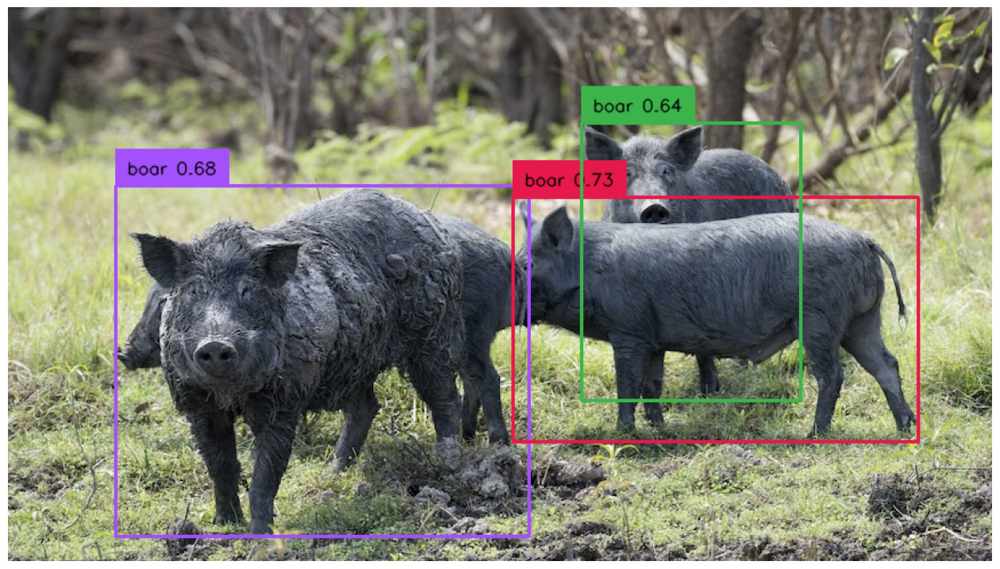

In [42]:
import supervision as sv

IMAGE_NAME = "boar_158.jpg"
IMAGE_PATH = os.path.join(IMG_FOLDER, IMAGE_NAME)

TEXT_PROMPT = "boar"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model, 
    image=image, 
    caption=TEXT_PROMPT, 
    box_threshold=BOX_TRESHOLD, 
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline  
sv.plot_image(annotated_frame, (16, 16))

In [13]:
annotated_frame.shape

(485, 862, 3)

In [14]:
boxes

tensor([[0.3198, 0.6391, 0.4194, 0.6323],
        [0.7195, 0.5643, 0.4114, 0.4414],
        [0.6943, 0.4601, 0.2220, 0.5012]])

In [15]:
logits

tensor([0.6751, 0.7328, 0.6353])

In [16]:
phrases

['boar', 'boar', 'boar']

In [17]:
def transform_to_yolo_annotation(phrases, boxes):

    dict = {'boar' : 0,
            'deer' : 1}
    output=''
    for i, classe in enumerate(phrases) :
        if i != 0:
            output += '\n'
        output += f'{dict[classe]} '
        output += ' '.join([str(i) for i in boxes[i].tolist()])
    return output


In [18]:
yolo_anotation = transform_to_yolo_annotation(phrases, boxes)

In [19]:
def save_anotation( yolo_anotation, filename ):
    
    file_path = filename +'.txt'
    print(file_path)
    # Create the output folder if it doesn't exist
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    
    print()
    # Open the file in write mode ('w')
    with open(file_path, 'w') as file:
        # Write the content to the file
        file.write(yolo_anotation)


In [20]:
ANNOTATIONS_FOLDER = os.path.join(HOME,'data', "labels")

save_anotation( yolo_anotation, ANNOTATIONS_FOLDER + "/boar_158" )

/home/matfox44/cerf_sanglier_detection/data/labels/boar_158.txt



In [21]:
os.path.split(ANNOTATIONS_FOLDER + "boar_200.txt")

('/home/matfox44/cerf_sanglier_detection/data', 'labelsboar_200.txt')

In [47]:
filename = IMAGE_NAME.split('.')[0]+'.txt'
ANNOTATION_fILE_PATH = os.path.join(ANNOTATIONS_FOLDER,filename)
ANNOTATION_fILE_PATH

'/home/matfox44/cerf_sanglier_detection/data/labels/boar_158.txt'

## Creating Annotation files (Yolo/Darknet style)

In [54]:
# Import GroundingDino libraries
import os
from tqdm import tqdm
import sys
sys.path.append(f'{HOME}/GroundingDINO')

from groundingdino.util.inference import load_model, load_image, predict, annotate

## Get image names from IMG_FOLDER
def get_image_names(IMG_FOLDER, extensions=None):
    if extensions is None:
        extensions = [".jpg", ".png", ".jpeg", ".gif", ".bmp"]  # Add more extensions if needed

    image_names = []
    for file in os.listdir(IMG_FOLDER):
        if any(file.lower().endswith(ext) for ext in extensions):
            image_names.append(file)

    return image_names

## Delete_file if not annotated
def delete_file(file_path):
    try:
        os.remove(file_path)
        print(f"File '{file_path}' deleted successfully.")
    except OSError as e:
        print(f"Error deleting file '{file_path}': {e}")

## Annotate Picture
def annotate(IMAGE_NAME, IMG_FOLDER, CLASS_NAME, BOX_TRESHOLD = 0.35, TEXT_TRESHOLD = 0.25 ):

    IMAGE_NAME = IMAGE_NAME
    IMAGE_PATH = os.path.join(IMG_FOLDER, IMAGE_NAME)

    TEXT_PROMPT = CLASS_NAME
    BOX_TRESHOLD = BOX_TRESHOLD
    TEXT_TRESHOLD = TEXT_TRESHOLD

    _, image = load_image(IMAGE_PATH)

    boxes, logits, phrases = predict(
        model=model, 
        image=image, 
        caption=TEXT_PROMPT, 
        box_threshold=BOX_TRESHOLD, 
        text_threshold=TEXT_TRESHOLD
    )

    return boxes, logits, phrases


## Transform boxes to YOLO format (darknet) 
def transform_to_yolo_annotation(phrases, boxes, dict_labels):
    output=''
    for i, classe in enumerate(phrases) :
        if i != 0:
            output += '\n'
        output += f'{dict_labels[classe]} '
        output += ' '.join([str(i) for i in boxes[i].tolist()])
    return output

## Save the annotation following YOLO training rule
def save_anotation( yolo_anotation, file_path ):

    # Create the output folder if it doesn't exist
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    # Open the file in write mode ('w')
    with open(file_path, 'w') as file:
        # Write the content to the file
        file.write(yolo_anotation)


## Creation of YOLO Annotation floder
def yolo_annotation(IMG_FOLDER,CONFIG_PATH, WEIGHTS_PATH, BOX_TRESHOLD = 0.35, TEXT_TRESHOLD = 0.25):
    
    ### Load Grounding DINO Model
    model = load_model(CONFIG_PATH, WEIGHTS_PATH)

    ### Extract IMAGE_NAMES from IMG_FOLDER
    IMAGE_NAMES = get_image_names(IMG_FOLDER)

    ### Define annotation folder
    DATA_FOLDER = os.path.dirname(IMG_FOLDER)
    ANNOTATIONS_FOLDER = os.path.join(DATA_FOLDER, "labels")
    dict_labels = {'boar' : 0,
                    'deer' : 1}

    non_annotated_imgs= []
    for IMAGE_NAME in tqdm(IMAGE_NAMES):
        CLASS_NAME = IMAGE_NAME.split('_')[0]

        if CLASS_NAME not in dict_labels:
            # If the label is not in the dictionary, add it and assign a new value
            new_value = max(dict_labels.values()) + 1  # Assign the next available value
            dict_labels[CLASS_NAME] = new_value


        try :
            boxes, _, phrases = annotate(IMAGE_NAME, IMG_FOLDER, CLASS_NAME, BOX_TRESHOLD = BOX_TRESHOLD, TEXT_TRESHOLD = TEXT_TRESHOLD )
            yolo_annotation = transform_to_yolo_annotation(phrases, boxes, dict_labels)

            filename = IMAGE_NAME.split('.')[0]+'.txt'
            ANNOTATION_fILE_PATH = os.path.join(ANNOTATIONS_FOLDER,filename)
            save_anotation( yolo_annotation, ANNOTATION_fILE_PATH )
        except :
            non_annotated_imgs.append(IMAGE_NAME)
            pass
    
    print(f'success : {round((1-len(non_annotated_imgs)/len(IMAGE_NAMES))*100, 2)}%')
    return dict_labels, non_annotated_imgs







In [55]:
dict_labels, non_annotated_imgs = yolo_annotation(IMG_FOLDER,CONFIG_PATH, WEIGHTS_PATH)

final text_encoder_type: bert-base-uncased


100%|██████████| 469/469 [01:57<00:00,  3.98it/s]

success : 98.93%


['deer_161.jpg', 'boar_201.jpg', 'deer_34.jpg', 'deer_230.jpg', 'boar_183.jpg']

In [57]:
non_annotated_imgs = ['deer_161.jpg', 'boar_201.jpg', 'deer_34.jpg', 'deer_230.jpg', 'boar_183.jpg']


## Train Test Validation folder split

In [99]:
import os
import shutil
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit

# Set the path to your data folder
DATA_FOLDER = os.path.join(HOME,'data')




def list_file_byclass(image_folder, dict_labels):
    final_dict = {}

    for key in dict_labels.keys():
        final_dict[key] = [image_file for image_file in get_image_names(image_folder)
                       if (image_file not in non_annotated_imgs) and (image_file.split('_')[0] == key)]
        
    return final_dict


def create_train_valid_test(DATA_FOLDER):
    # List all image files in the 'images' folder 
    image_folder = os.path.join(DATA_FOLDER, 'images')
    image_files = [image_file for image_file in get_image_names(image_folder)
                       if (image_file not in non_annotated_imgs)]
    # Split the data into training, validation, and testing sets
    train_images, test_images = train_test_split(image_files, test_size=0.2)
    train_images, valid_images = train_test_split(train_images, test_size=0.2)

    return train_images, valid_images, test_images

# Move images to the respective folders
def move_images(source_folder, destination_folder, image_list):
    for image in tqdm(image_list):
        img_source_path = os.path.join(source_folder, image)
        img_destination_path = os.path.join(destination_folder, image)

        label = image.split('.')[0]+'.txt'
        label_source_folder = os.path.join(DATA_FOLDER, 'labels')
        label_destination_folder = os.path.join(DATA_FOLDER, 'labels', destination_folder.split('/')[-1])

        label_source_path = os.path.join(label_source_folder, label)
        label_destination_path = os.path.join(label_destination_folder, label)

        shutil.copy(img_source_path , img_destination_path)
        shutil.copy(label_source_path , label_destination_path)


def create_train_valid_test_stratified(DATA_FOLDER):

    # List all image files in the 'images' folder 
    image_folder = os.path.join(DATA_FOLDER, 'images')
    image_files = [image_file for image_file in get_image_names(image_folder)
                       if (image_file not in non_annotated_imgs)]

    # Extract labels from file names
    labels = [f.split('_')[0] for f in image_files]

    # Split the data into training, validation, and testing sets with stratification
    stratified_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2)
    train_index, test_index = next(stratified_splitter.split(image_files, labels))

    train_images, test_images = [image_files[i] for i in train_index], [image_files[i] for i in test_index]
    train_labels, test_labels = [labels[i] for i in train_index], [labels[i] for i in test_index]

    stratified_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2)
    train_index, valid_index = next(stratified_splitter.split(train_images, train_labels))

    train_images, valid_images = [train_images[i] for i in train_index], [train_images[i] for i in valid_index]

    return train_images, valid_images, test_images

def create_train_valid_test_folders(DATA_FOLDER, stratified = True):

    # Define the paths for the new images folders
    train_folder = os.path.join(DATA_FOLDER,'images','train_data')
    valid_folder = os.path.join(DATA_FOLDER,'images','valid_data')
    test_folder = os.path.join(DATA_FOLDER,'images','test_data')

    # Create the new folders if they don't exist
    for img_folder in [train_folder, valid_folder, test_folder]:
        
        labels_folder = os.path.join(DATA_FOLDER, 'labels', img_folder.split('/')[-1])
        
        if not os.path.exists(img_folder):
            os.makedirs(img_folder)

        if not os.path.exists(labels_folder):
            os.makedirs(labels_folder)


    if stratified :
        train_images, valid_images, test_images = create_train_valid_test_stratified(DATA_FOLDER)
    else :
        train_images, valid_images, test_images = create_train_valid_test(DATA_FOLDER)

    image_folder = os.path.join(DATA_FOLDER, 'images')
    move_images(image_folder, train_folder, train_images)
    move_images(image_folder, valid_folder, valid_images)
    move_images(image_folder, test_folder, test_images)


    



In [100]:
# Set the path to your data folder
DATA_FOLDER = os.path.join(HOME,'data')
create_train_valid_test_folders(DATA_FOLDER, stratified = True)


100%|██████████| 93/93 [00:00<00:00, 3440.11it/s]


## Creating confi file for YOLO training

In [104]:
def create_config_file(DATA_FOLDER, train_folder, valid_folder, dict_labels):
  output = f'path: {DATA_FOLDER}\n'
  output += f'train: {train_folder}\n'
  output += f'val: {valid_folder}\n'
  output += '# Classes \n'
  for class_name, class_label  in dict_labels.items():
    output += f'  {class_label}: {class_name}'
  return output

train_folder = os.path.join(DATA_FOLDER,'images','train_data')
valid_folder = os.path.join(DATA_FOLDER,'images','valid_data')
create_config_file(DATA_FOLDER, train_folder, valid_folder, dict_labels)

'path: /home/matfox44/cerf_sanglier_detection/data\ntrain: /home/matfox44/cerf_sanglier_detection/data/images/train_data\nval: /home/matfox44/cerf_sanglier_detection/data/images/valid_data\n# Classes \n  0: boar  1: deer'

In [109]:
# Create config.yaml file for training

def create_config_str(DATA_FOLDER, train_folder, valid_folder, dict_labels):
  output = f'\npath: {DATA_FOLDER}\n'
  output += f'train: {train_folder}\n'
  output += f'val: {valid_folder}\n'
  output += '\n# Classes \nnames:\n'
  for class_name, class_label  in dict_labels.items():
    output += f'  {class_label}: {class_name}\n'
  return output


def save_config_file( config_file, file_path ):
    # Create the output folder if it doesn't exist
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    # Open the file in write mode ('w')
    with open(file_path, 'w') as file:
        # Write the content to the file
        file.write(config_file)

def create_config_file(DATA_FOLDER, train_folder, valid_folder, dict_labels,file_path):
  config_file = create_config_str(DATA_FOLDER, train_folder, valid_folder, dict_labels)
  save_config_file( config_file, file_path )

DATA_FOLDER = os.path.join(HOME,'data')
train_folder = os.path.join(DATA_FOLDER,'images','train_data')
valid_folder = os.path.join(DATA_FOLDER,'images','valid_data')
dict_labels = {'boar' : 0,
               'deer' : 1}

config_file_path = os.path.join(HOME, 'config.yaml')


create_config_file(DATA_FOLDER, train_folder, valid_folder, dict_labels,config_file_path)





## YOLO training

In [1]:
import os
HOME = os.getcwd()
HOME = os.path.dirname(HOME)
print(HOME)
%cd {HOME}

/home/matfox44/cerf_sanglier_detection
/home/matfox44/cerf_sanglier_detection


In [2]:
from ultralytics import YOLO
import torch

config_file_path = os.path.join(HOME, 'config.yaml')
i=10
# Load a model
# model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO(f"{HOME}/weights/yolov8n.pt") # load pretrained model
# model = YOLO(f"{HOME}/runs/detect/train{i}/weights/best.pt")
# Use the model
results = model.train(data=config_file_path, epochs=300, batch = 7)  # train the model

# for i in range(10):
#     torch.cuda.empty_cache()
#     model = YOLO(f"{HOME}/runs/detect/train{i+2}/weights/best.pt")
#     results = model.train(data=config_file_path, epochs=3)  # train the model


/home/matfox44/miniconda3/envs/cerf_sanglier/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Ultralytics YOLOv8.1.5 🚀 Python-3.10.11 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 8192MiB)
engine/trainer: task=detect, mode=train, model=/home/matfox44/cerf_sanglier_detection/weights/yolov8n.pt, data=/home/matfox44/cerf_sanglier_detection/config.yaml, epochs=300, time=None, patience=50, batch=7, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train13, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False

train: Scanning /home/matfox44/cerf_sanglier_detection/data/labels/train_data.cache... 296 images, 1 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<?, ?it/s]
val: Scanning /home/matfox44/cerf_sanglier_detection/data/labels/valid_data.cache... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<?, ?it/s]


Plotting labels to runs/detect/train13/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0004921875), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train13
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300      1.09G     0.8344      2.281      1.242          7        640: 100%|██████████| 43/43 [00:05<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.07it/s]

                   all         75        124      0.783      0.449      0.592      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300       1.1G     0.9028       1.73      1.304         17        640: 100%|██████████| 43/43 [00:03<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.54it/s]

                   all         75        124      0.517      0.556      0.558       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300       1.1G      1.006      1.689      1.353         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.68it/s]

                   all         75        124      0.438      0.581      0.526      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300       1.1G      1.035      1.643      1.381         14        640: 100%|██████████| 43/43 [00:04<00:00,  9.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.21it/s]

                   all         75        124      0.792      0.512      0.637      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300       1.1G      1.022      1.571      1.375          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.09it/s]

                   all         75        124      0.694      0.646      0.715      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300       1.1G      1.056      1.626      1.387         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.07it/s]

                   all         75        124      0.678      0.545      0.609      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300       1.1G      1.073      1.554      1.417          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.43it/s]

                   all         75        124      0.721      0.649      0.765      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      1.09G      1.036      1.482      1.381         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.19it/s]

                   all         75        124      0.842      0.677      0.796      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300       1.1G      1.014      1.394      1.337         20        640: 100%|██████████| 43/43 [00:03<00:00, 11.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.92it/s]

                   all         75        124       0.84      0.621      0.759      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      1.09G     0.9785      1.385      1.343         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.38it/s]

                   all         75        124      0.746      0.606      0.729      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300       1.1G     0.9497      1.364      1.325          6        640: 100%|██████████| 43/43 [00:04<00:00, 10.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.05it/s]

                   all         75        124      0.752      0.653      0.741      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300       1.1G     0.9317      1.265      1.289         11        640: 100%|██████████| 43/43 [00:03<00:00, 10.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.64it/s]

                   all         75        124      0.762      0.722      0.803      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      1.09G     0.9167      1.195      1.278          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.01it/s]

                   all         75        124      0.849      0.655      0.751      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300       1.1G     0.8963      1.189      1.274          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.21it/s]

                   all         75        124      0.779      0.685      0.755      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300       1.1G      0.891      1.162      1.262         10        640: 100%|██████████| 43/43 [00:04<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.60it/s]

                   all         75        124      0.899       0.71      0.805      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300       1.1G     0.9072      1.154      1.273         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.10it/s]

                   all         75        124      0.848      0.717       0.79      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      1.09G     0.8989      1.139      1.259         13        640: 100%|██████████| 43/43 [00:04<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.32it/s]

                   all         75        124      0.817      0.748      0.784      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      1.09G     0.8705        1.1      1.262          9        640: 100%|██████████| 43/43 [00:04<00:00, 10.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.81it/s]

                   all         75        124      0.826      0.673      0.769      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      1.09G     0.9134      1.115      1.267          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.55it/s]

                   all         75        124      0.823      0.685      0.766      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      1.09G     0.8586      1.077      1.231         11        640: 100%|██████████| 43/43 [00:03<00:00, 11.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.51it/s]

                   all         75        124      0.784      0.742      0.816      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      1.09G     0.8608      1.058      1.262         20        640: 100%|██████████| 43/43 [00:04<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.06it/s]

                   all         75        124      0.819      0.718      0.802      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      1.09G     0.8861      1.068       1.27          5        640: 100%|██████████| 43/43 [00:03<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.44it/s]

                   all         75        124      0.849      0.776      0.848      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      1.09G     0.8427      1.045      1.229          4        640: 100%|██████████| 43/43 [00:03<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.20it/s]

                   all         75        124      0.843      0.766      0.839      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300       1.1G     0.8188     0.9632      1.211          6        640: 100%|██████████| 43/43 [00:04<00:00, 10.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.39it/s]

                   all         75        124      0.923      0.742      0.852      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300       1.1G     0.7879     0.9349      1.185         17        640: 100%|██████████| 43/43 [00:03<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.93it/s]

                   all         75        124      0.888      0.749      0.845       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300      1.09G     0.8204     0.9462      1.213         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.05it/s]

                   all         75        124       0.95      0.747      0.887      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300       1.1G     0.8149     0.9312      1.211         10        640: 100%|██████████| 43/43 [00:03<00:00, 10.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.58it/s]

                   all         75        124      0.913      0.758      0.877      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      1.09G      0.815     0.9467      1.233          7        640: 100%|██████████| 43/43 [00:03<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.21it/s]

                   all         75        124      0.881        0.8      0.858      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300      1.09G     0.8078     0.9649      1.207         32        640: 100%|██████████| 43/43 [00:03<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.65it/s]

                   all         75        124      0.844      0.766      0.832      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300       1.1G     0.8053     0.9743      1.206         17        640: 100%|██████████| 43/43 [00:03<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.87it/s]

                   all         75        124      0.892      0.758       0.85      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300      1.09G     0.8131     0.9442      1.221         17        640: 100%|██████████| 43/43 [00:04<00:00, 10.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.09it/s]

                   all         75        124      0.853       0.75      0.836      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300      1.09G     0.7743     0.9174      1.201          9        640: 100%|██████████| 43/43 [00:03<00:00, 10.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.19it/s]

                   all         75        124      0.817      0.783      0.833      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300       1.1G     0.8098      0.936      1.198          7        640: 100%|██████████| 43/43 [00:03<00:00, 11.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.17it/s]

                   all         75        124      0.891       0.72      0.842      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300       1.1G     0.7577     0.8498      1.182         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.86it/s]

                   all         75        124      0.818      0.782      0.859      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300      1.09G     0.7737     0.8452      1.186         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.08it/s]

                   all         75        124      0.894      0.792      0.871      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300       1.1G     0.7291     0.8026      1.159         16        640: 100%|██████████| 43/43 [00:03<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.48it/s]

                   all         75        124       0.87      0.782      0.858      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300      1.09G     0.7657     0.8375      1.173          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.81it/s]

                   all         75        124      0.892      0.694      0.843      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300      1.09G     0.7651     0.8738      1.184          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.34it/s]

                   all         75        124      0.841      0.771      0.828      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300       1.1G     0.7222     0.8353      1.151          9        640: 100%|██████████| 43/43 [00:04<00:00, 10.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.03it/s]

                   all         75        124      0.901      0.755      0.824       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300       1.1G     0.7173     0.8185      1.156         14        640: 100%|██████████| 43/43 [00:04<00:00, 10.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.85it/s]

                   all         75        124      0.861      0.822      0.858      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      1.09G     0.7205     0.7716      1.165         15        640: 100%|██████████| 43/43 [00:03<00:00, 11.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.54it/s]

                   all         75        124      0.872      0.756      0.844      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300       1.1G     0.7466     0.8184      1.162          7        640: 100%|██████████| 43/43 [00:04<00:00, 10.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.96it/s]

                   all         75        124       0.86      0.773      0.868      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300      1.09G     0.6836     0.7821      1.131          8        640: 100%|██████████| 43/43 [00:04<00:00, 10.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.05it/s]

                   all         75        124      0.874        0.7      0.847      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      1.09G     0.7328     0.7877      1.161         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.78it/s]

                   all         75        124      0.949      0.782      0.882      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      1.09G     0.7097     0.7987      1.163          6        640: 100%|██████████| 43/43 [00:03<00:00, 11.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.12it/s]

                   all         75        124       0.82       0.76      0.837      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      1.09G     0.7197     0.8017      1.145         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.27it/s]

                   all         75        124      0.896      0.771      0.858      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300      1.09G     0.6923     0.7604      1.131         17        640: 100%|██████████| 43/43 [00:03<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.12it/s]

                   all         75        124      0.876      0.798      0.855       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300       1.1G     0.6972     0.7663      1.149         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.96it/s]

                   all         75        124      0.857      0.764      0.849      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      1.14G     0.7094     0.7641      1.141         13        640: 100%|██████████| 43/43 [00:04<00:00, 10.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.31it/s]

                   all         75        124      0.885      0.742      0.863      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      1.09G     0.6863     0.7213      1.144         22        640: 100%|██████████| 43/43 [00:03<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.70it/s]

                   all         75        124       0.94      0.712      0.877      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300       1.1G     0.6957      0.729      1.134         18        640: 100%|██████████| 43/43 [00:03<00:00, 11.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.74it/s]

                   all         75        124      0.838      0.838      0.891      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300      1.09G     0.6829     0.7408       1.13          7        640: 100%|██████████| 43/43 [00:04<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.25it/s]

                   all         75        124      0.805      0.753      0.838      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      1.09G     0.6714     0.7106      1.111          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.43it/s]

                   all         75        124      0.935      0.766      0.846       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300      1.09G     0.6405     0.6674      1.105          7        640: 100%|██████████| 43/43 [00:04<00:00, 10.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.00it/s]

                   all         75        124      0.963      0.757      0.855       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300       1.1G      0.679     0.7144      1.117         16        640: 100%|██████████| 43/43 [00:03<00:00, 11.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.49it/s]

                   all         75        124      0.915      0.759       0.86       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      1.09G     0.6981     0.7374      1.148         12        640: 100%|██████████| 43/43 [00:04<00:00, 10.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.52it/s]

                   all         75        124      0.922       0.75      0.862      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300      1.09G     0.6909     0.7439      1.142          8        640: 100%|██████████| 43/43 [00:03<00:00, 12.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.37it/s]

                   all         75        124        0.9      0.814      0.881      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      1.09G     0.6871     0.7261      1.119         15        640: 100%|██████████| 43/43 [00:03<00:00, 11.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.83it/s]

                   all         75        124      0.917      0.781      0.868      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      1.09G       0.67     0.6985      1.119         13        640: 100%|██████████| 43/43 [00:03<00:00, 12.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.36it/s]

                   all         75        124      0.861      0.807      0.886      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300       1.1G     0.7069     0.7237      1.134         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.76it/s]

                   all         75        124      0.927      0.774      0.898      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300       1.1G     0.6595      0.694      1.096          9        640: 100%|██████████| 43/43 [00:03<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.36it/s]

                   all         75        124      0.863      0.799      0.881      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      1.09G     0.6581     0.7035      1.095          6        640: 100%|██████████| 43/43 [00:03<00:00, 10.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.82it/s]

                   all         75        124      0.929      0.778      0.875      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300       1.1G     0.6393     0.6826      1.116         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.47it/s]

                   all         75        124      0.918      0.754      0.871      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      1.09G     0.6547     0.6938      1.116         12        640: 100%|██████████| 43/43 [00:03<00:00, 10.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.66it/s]

                   all         75        124      0.926       0.77      0.867      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300       1.1G     0.6877     0.6955      1.133         17        640: 100%|██████████| 43/43 [00:03<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.48it/s]

                   all         75        124      0.935      0.806      0.869      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300       1.1G     0.6509     0.6598      1.109         16        640: 100%|██████████| 43/43 [00:03<00:00, 11.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.60it/s]

                   all         75        124      0.947      0.789      0.879      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300       1.1G     0.6369     0.6693      1.106         19        640: 100%|██████████| 43/43 [00:04<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.01it/s]

                   all         75        124      0.927      0.757      0.871      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300       1.1G     0.6211     0.6695       1.09         16        640: 100%|██████████| 43/43 [00:03<00:00, 11.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.65it/s]

                   all         75        124      0.882      0.765      0.863      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      1.09G     0.6103      0.637      1.085          6        640: 100%|██████████| 43/43 [00:03<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.05it/s]

                   all         75        124      0.877      0.806      0.893      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300       1.1G      0.624     0.6396      1.112         12        640: 100%|██████████| 43/43 [00:03<00:00, 10.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.21it/s]

                   all         75        124      0.943      0.776        0.9      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300      1.08G     0.6342     0.6543      1.122          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.69it/s]

                   all         75        124       0.88      0.773      0.878      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300      1.09G     0.6326     0.6504      1.105          8        640: 100%|██████████| 43/43 [00:04<00:00, 10.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.66it/s]

                   all         75        124      0.803       0.84      0.866      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300       1.1G     0.6554     0.6681      1.141         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.38it/s]

                   all         75        124       0.94       0.73      0.882      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300      1.09G     0.6344     0.6574      1.102          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.56it/s]

                   all         75        124      0.912      0.742      0.885      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300      1.09G       0.63     0.6529      1.105         11        640: 100%|██████████| 43/43 [00:03<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.92it/s]

                   all         75        124       0.95      0.781      0.888       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300       1.1G     0.5919     0.6334      1.066         16        640: 100%|██████████| 43/43 [00:04<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.41it/s]

                   all         75        124        0.9      0.806      0.881      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      1.09G     0.5858     0.5982       1.08          6        640: 100%|██████████| 43/43 [00:03<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.38it/s]

                   all         75        124      0.927       0.79      0.884       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300      1.09G     0.6206     0.6258      1.093          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.66it/s]

                   all         75        124       0.91      0.758      0.863      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      1.09G     0.6147     0.6408      1.106          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.04it/s]

                   all         75        124      0.877      0.833      0.891      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300      1.09G     0.6159     0.6238      1.085         15        640: 100%|██████████| 43/43 [00:03<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.74it/s]

                   all         75        124      0.964      0.766      0.869      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300       1.1G     0.6154      0.637      1.086         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.67it/s]

                   all         75        124      0.909      0.788      0.871      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      1.09G     0.6077     0.5977      1.079          7        640: 100%|██████████| 43/43 [00:04<00:00, 10.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.75it/s]

                   all         75        124      0.917      0.795      0.885      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300       1.1G     0.5938     0.5996      1.084          4        640: 100%|██████████| 43/43 [00:03<00:00, 11.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.47it/s]

                   all         75        124      0.891      0.806      0.881      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300       1.1G     0.6059     0.5905       1.09         20        640: 100%|██████████| 43/43 [00:03<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.54it/s]

                   all         75        124      0.909      0.768      0.884       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300       1.1G     0.5939     0.6019      1.075         20        640: 100%|██████████| 43/43 [00:03<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.66it/s]

                   all         75        124      0.932      0.757      0.868      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300      1.09G     0.6185     0.6259      1.108          5        640: 100%|██████████| 43/43 [00:04<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.71it/s]

                   all         75        124      0.924      0.785      0.881      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300       1.1G     0.6092     0.5842       1.09          7        640: 100%|██████████| 43/43 [00:04<00:00,  9.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.20it/s]

                   all         75        124      0.951      0.772      0.902      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300      1.09G     0.5817     0.5822      1.061          7        640: 100%|██████████| 43/43 [00:03<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.22it/s]

                   all         75        124       0.93      0.798      0.899      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      1.08G     0.5992     0.5681      1.081          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.72it/s]

                   all         75        124      0.895      0.806      0.887      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300      1.09G      0.561     0.5543      1.049          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.47it/s]

                   all         75        124      0.931       0.79      0.901      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      1.09G     0.5826     0.5609      1.062         17        640: 100%|██████████| 43/43 [00:03<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.32it/s]

                   all         75        124      0.862      0.852      0.909       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300       1.1G     0.5918     0.5842      1.076         15        640: 100%|██████████| 43/43 [00:03<00:00, 11.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.25it/s]

                   all         75        124      0.903      0.826      0.912      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300       1.1G     0.5967     0.5781      1.058         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.16it/s]

                   all         75        124      0.874      0.798      0.887       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      1.09G     0.5802     0.5784      1.063         22        640: 100%|██████████| 43/43 [00:03<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.83it/s]

                   all         75        124       0.87      0.855      0.897      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300       1.1G     0.5879     0.5778      1.069         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 14.03it/s]

                   all         75        124      0.918      0.839      0.911      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300      1.09G     0.5502     0.5452      1.045          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.79it/s]

                   all         75        124      0.922      0.782       0.89      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300       1.1G     0.5738     0.5565      1.061         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.14it/s]

                   all         75        124      0.935      0.801      0.898      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300      1.09G     0.5696     0.5408      1.058         15        640: 100%|██████████| 43/43 [00:03<00:00, 10.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.16it/s]

                   all         75        124      0.901      0.865      0.908      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      1.09G     0.5557     0.5285      1.056         13        640: 100%|██████████| 43/43 [00:03<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.19it/s]

                   all         75        124      0.888      0.852      0.888      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300       1.1G     0.5688     0.5715      1.053         10        640: 100%|██████████| 43/43 [00:04<00:00,  9.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.60it/s]

                   all         75        124      0.923      0.816      0.888      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300       1.1G     0.5733      0.578      1.059         13        640: 100%|██████████| 43/43 [00:03<00:00, 10.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.12it/s]

                   all         75        124      0.918      0.786      0.889      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300       1.1G     0.5649      0.562      1.065         16        640: 100%|██████████| 43/43 [00:03<00:00, 11.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.16it/s]

                   all         75        124       0.96      0.798      0.905      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      1.09G     0.5429     0.5559      1.048         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.25it/s]

                   all         75        124      0.819      0.873       0.91      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      1.09G     0.5467     0.5423      1.034         25        640: 100%|██████████| 43/43 [00:03<00:00, 12.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.38it/s]

                   all         75        124      0.938      0.806      0.916       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300       1.1G     0.5293     0.5437      1.029         13        640: 100%|██████████| 43/43 [00:04<00:00, 10.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.27it/s]

                   all         75        124      0.896       0.84      0.903      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      1.09G     0.5828      0.593      1.083         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.81it/s]

                   all         75        124      0.891      0.823      0.891      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300      1.08G     0.5621     0.5561      1.065         20        640: 100%|██████████| 43/43 [00:03<00:00, 11.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.48it/s]

                   all         75        124       0.93      0.819      0.888      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300       1.1G     0.5635     0.5523      1.057          9        640: 100%|██████████| 43/43 [00:04<00:00, 10.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.95it/s]

                   all         75        124      0.955      0.798      0.891      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300       1.1G     0.5359     0.5307      1.041         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.09it/s]

                   all         75        124      0.932      0.798      0.898      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300       1.1G     0.5865     0.5585      1.062         10        640: 100%|██████████| 43/43 [00:03<00:00, 10.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.25it/s]

                   all         75        124      0.902      0.813        0.9      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      1.09G     0.5338     0.5144      1.043          6        640: 100%|██████████| 43/43 [00:03<00:00, 10.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.94it/s]

                   all         75        124      0.876      0.839      0.898      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300      1.09G     0.5386     0.5238      1.055          4        640: 100%|██████████| 43/43 [00:03<00:00, 11.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.49it/s]

                   all         75        124      0.896      0.811      0.893      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300       1.1G     0.5384     0.5162      1.024         15        640: 100%|██████████| 43/43 [00:04<00:00, 10.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.60it/s]

                   all         75        124      0.892      0.819      0.896      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300       1.1G     0.5332     0.5284      1.025          3        640: 100%|██████████| 43/43 [00:03<00:00, 11.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.79it/s]

                   all         75        124      0.829      0.811      0.886       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      1.09G     0.5392     0.5187      1.046          9        640: 100%|██████████| 43/43 [00:04<00:00, 10.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.64it/s]

                   all         75        124       0.84      0.835      0.871      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      1.09G     0.5314     0.5148      1.036         25        640: 100%|██████████| 43/43 [00:04<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.01it/s]

                   all         75        124       0.94      0.782      0.883      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300      1.09G     0.5105     0.5136      1.025         10        640: 100%|██████████| 43/43 [00:03<00:00, 10.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.53it/s]

                   all         75        124      0.894       0.82      0.873      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300       1.1G     0.5198     0.5027      1.024         13        640: 100%|██████████| 43/43 [00:03<00:00, 12.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.28it/s]

                   all         75        124      0.881       0.81      0.869        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300      1.09G     0.5295     0.5376      1.052         23        640: 100%|██████████| 43/43 [00:04<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.70it/s]

                   all         75        124      0.896      0.839      0.907      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300       1.1G     0.5315      0.513      1.023         10        640: 100%|██████████| 43/43 [00:04<00:00, 10.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.68it/s]

                   all         75        124      0.903      0.811      0.898      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      1.09G     0.5364     0.5094      1.072          4        640: 100%|██████████| 43/43 [00:04<00:00, 10.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.92it/s]

                   all         75        124      0.928      0.777      0.871      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300       1.1G     0.5432     0.5129      1.051         12        640: 100%|██████████| 43/43 [00:04<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.71it/s]

                   all         75        124       0.89      0.806      0.886      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300       1.1G     0.5489      0.508      1.046         11        640: 100%|██████████| 43/43 [00:03<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.35it/s]

                   all         75        124      0.904      0.841      0.906      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300       1.1G     0.5449     0.5233      1.052         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.93it/s]

                   all         75        124      0.942      0.782      0.909      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300      1.09G     0.5089     0.4994      1.026         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.48it/s]

                   all         75        124      0.883      0.837       0.89      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      1.09G      0.513     0.5049      1.022         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.04it/s]

                   all         75        124      0.876      0.839      0.887      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      1.09G     0.5581     0.5337      1.049          8        640: 100%|██████████| 43/43 [00:04<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.06it/s]

                   all         75        124      0.871      0.839        0.9      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300      1.09G     0.5248     0.5019      1.029          4        640: 100%|██████████| 43/43 [00:04<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.81it/s]

                   all         75        124      0.958      0.774      0.897      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      1.09G     0.4982     0.4867      1.005         10        640: 100%|██████████| 43/43 [00:04<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.53it/s]

                   all         75        124      0.901      0.866      0.907      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      1.09G     0.5128     0.4742      1.013         18        640: 100%|██████████| 43/43 [00:03<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.39it/s]

                   all         75        124      0.932      0.819      0.897      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300       1.1G     0.4862     0.4757      1.012         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.68it/s]

                   all         75        124      0.906      0.784      0.877      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300       1.1G     0.5178     0.5057      1.017         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.66it/s]

                   all         75        124       0.91      0.809       0.88      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300       1.1G     0.5101     0.4962      1.025         18        640: 100%|██████████| 43/43 [00:03<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.71it/s]

                   all         75        124      0.906      0.835      0.903      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      1.08G     0.5123      0.506      1.044         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.55it/s]

                   all         75        124      0.929      0.767      0.887      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300       1.1G     0.5162     0.4869      1.026         14        640: 100%|██████████| 43/43 [00:03<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.81it/s]

                   all         75        124      0.918      0.821      0.893      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      1.09G     0.5092      0.485      1.029          4        640: 100%|██████████| 43/43 [00:03<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.26it/s]

                   all         75        124      0.927      0.819       0.89      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      1.09G      0.506     0.4724      1.027          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.53it/s]

                   all         75        124       0.92      0.831      0.898      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300       1.1G     0.5186     0.4937      1.045         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.27it/s]

                   all         75        124      0.881      0.831      0.895      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      1.09G     0.5082     0.5291      1.021         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.70it/s]

                   all         75        124      0.919      0.788      0.894      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      1.09G     0.4864     0.4865      1.019         10        640: 100%|██████████| 43/43 [00:04<00:00,  9.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.39it/s]

                   all         75        124      0.865      0.824      0.892      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      1.09G     0.4882     0.4658      1.012         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.75it/s]

                   all         75        124      0.856      0.781      0.881      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300       1.1G     0.5036     0.4938      1.019         17        640: 100%|██████████| 43/43 [00:04<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.40it/s]

                   all         75        124      0.905      0.764      0.882      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      1.08G     0.4881     0.4587      1.001         19        640: 100%|██████████| 43/43 [00:04<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.58it/s]

                   all         75        124      0.912      0.831      0.906      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300      1.09G     0.5093      0.469      1.028         22        640: 100%|██████████| 43/43 [00:03<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.77it/s]

                   all         75        124      0.899      0.835      0.904      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300       1.1G     0.4802     0.4647      1.007         17        640: 100%|██████████| 43/43 [00:03<00:00, 11.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.41it/s]

                   all         75        124      0.893      0.828      0.903      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300       1.1G     0.4945     0.4759      1.023          7        640: 100%|██████████| 43/43 [00:03<00:00, 11.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.70it/s]

                   all         75        124      0.938      0.785      0.903      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300       1.1G     0.5019     0.4822      1.024          9        640: 100%|██████████| 43/43 [00:04<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.13it/s]

                   all         75        124      0.944      0.759      0.895      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300      1.09G     0.5028      0.467      1.016          6        640: 100%|██████████| 43/43 [00:03<00:00, 11.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.70it/s]

                   all         75        124      0.934      0.783      0.899      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300       1.1G      0.484     0.4634     0.9983         11        640: 100%|██████████| 43/43 [00:03<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.27it/s]

                   all         75        124      0.923      0.806      0.905      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/300      1.09G     0.5031     0.4937      1.033          4        640: 100%|██████████| 43/43 [00:04<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.39it/s]

                   all         75        124       0.94      0.818      0.901      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/300       1.1G     0.4964     0.4555      1.011         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.18it/s]

                   all         75        124      0.941      0.839       0.92       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/300      1.08G     0.4628     0.4578      1.006          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.19it/s]

                   all         75        124      0.928      0.827      0.911      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/300      1.09G     0.4731     0.4421      1.007         11        640: 100%|██████████| 43/43 [00:03<00:00, 11.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.28it/s]

                   all         75        124      0.919       0.79      0.897      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/300       1.1G     0.4955     0.4819      1.007         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.84it/s]

                   all         75        124       0.92      0.798      0.899      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/300      1.09G     0.4761     0.4571      1.004          8        640: 100%|██████████| 43/43 [00:04<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 14.03it/s]

                   all         75        124      0.951       0.79      0.906      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/300       1.1G     0.4787     0.4578     0.9992          4        640: 100%|██████████| 43/43 [00:03<00:00, 11.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.65it/s]

                   all         75        124      0.959       0.81      0.909      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/300      1.09G     0.4682     0.4466     0.9972         15        640: 100%|██████████| 43/43 [00:03<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.78it/s]

                   all         75        124      0.931      0.794      0.905      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/300       1.1G     0.4819     0.4569     0.9986         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.89it/s]

                   all         75        124      0.866      0.863      0.912      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/300       1.1G     0.4861     0.4578      1.007         15        640: 100%|██████████| 43/43 [00:04<00:00, 10.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.61it/s]

                   all         75        124      0.921       0.78      0.884      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/300      1.09G     0.4641      0.436      1.012         19        640: 100%|██████████| 43/43 [00:04<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.13it/s]

                   all         75        124      0.892      0.779      0.881       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/300      1.08G      0.486     0.4591      1.007         38        640: 100%|██████████| 43/43 [00:03<00:00, 10.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.35it/s]

                   all         75        124      0.889       0.79      0.888      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/300      1.09G     0.4698     0.4346     0.9959         12        640: 100%|██████████| 43/43 [00:03<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.01it/s]

                   all         75        124      0.915      0.798      0.888      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/300       1.1G     0.4896     0.4448      1.025         12        640: 100%|██████████| 43/43 [00:03<00:00, 10.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.81it/s]

                   all         75        124      0.951      0.806      0.904      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/300      1.09G     0.4706     0.4462     0.9985         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.09it/s]

                   all         75        124      0.949      0.822      0.904      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/300      1.09G     0.4617     0.4442      1.002         19        640: 100%|██████████| 43/43 [00:03<00:00, 11.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.94it/s]

                   all         75        124      0.937      0.797      0.906      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/300       1.1G     0.4711     0.4417      1.009         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.20it/s]

                   all         75        124      0.916      0.818      0.895      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/300      1.09G     0.4522     0.4189      0.992         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.14it/s]

                   all         75        124      0.932      0.794      0.885      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/300      1.09G     0.4895     0.4587      1.033          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.10it/s]

                   all         75        124       0.88       0.81      0.894      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/300       1.1G     0.4727     0.4148     0.9993          6        640: 100%|██████████| 43/43 [00:03<00:00, 12.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.41it/s]

                   all         75        124      0.908      0.795      0.887      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/300      1.09G     0.4504     0.4164     0.9843         13        640: 100%|██████████| 43/43 [00:04<00:00, 10.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.72it/s]

                   all         75        124      0.914       0.78      0.885      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/300      1.09G     0.4495     0.4286     0.9915         34        640: 100%|██████████| 43/43 [00:03<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.88it/s]

                   all         75        124      0.907      0.794      0.889      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/300      1.09G     0.4657     0.4336       1.01          7        640: 100%|██████████| 43/43 [00:03<00:00, 11.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.03it/s]

                   all         75        124      0.872      0.862      0.905      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/300       1.1G     0.4755     0.4604      1.007         13        640: 100%|██████████| 43/43 [00:03<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.59it/s]

                   all         75        124      0.933      0.821      0.913      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/300      1.09G      0.467     0.4165          1          7        640: 100%|██████████| 43/43 [00:03<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.39it/s]

                   all         75        124      0.931      0.774      0.906      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/300      1.09G      0.458     0.4173     0.9956          9        640: 100%|██████████| 43/43 [00:03<00:00, 10.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.89it/s]

                   all         75        124      0.862      0.859      0.914      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/300      1.09G     0.4643     0.4243       1.01          9        640: 100%|██████████| 43/43 [00:04<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.74it/s]

                   all         75        124      0.906      0.828      0.906      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/300       1.1G     0.4574     0.4168      0.982         13        640: 100%|██████████| 43/43 [00:04<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.37it/s]

                   all         75        124      0.918      0.818      0.899      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/300      1.09G     0.4422     0.4158     0.9863         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.08it/s]

                   all         75        124      0.897      0.834      0.903       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/300      1.09G     0.4571     0.4374      1.009         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.09it/s]

                   all         75        124      0.938      0.779      0.897      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/300      1.09G     0.4273     0.4136     0.9723          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.65it/s]

                   all         75        124      0.928      0.778      0.899      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/300      1.09G     0.4301     0.3952     0.9838          8        640: 100%|██████████| 43/43 [00:04<00:00, 10.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.97it/s]

                   all         75        124      0.926      0.798      0.899      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/300      1.09G     0.4447     0.4044     0.9869          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.63it/s]

                   all         75        124      0.934      0.815      0.905      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/300      1.09G     0.4565     0.4305     0.9807         18        640: 100%|██████████| 43/43 [00:03<00:00, 11.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.85it/s]

                   all         75        124      0.901      0.837      0.898      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/300       1.1G     0.4232      0.415     0.9719          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.20it/s]

                   all         75        124      0.905      0.829       0.88      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/300      1.09G     0.4387     0.4092     0.9966         15        640: 100%|██████████| 43/43 [00:03<00:00, 10.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.58it/s]

                   all         75        124      0.939      0.815       0.89      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/300       1.1G     0.4162     0.4044     0.9741          9        640: 100%|██████████| 43/43 [00:03<00:00, 10.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.38it/s]

                   all         75        124      0.938      0.816      0.899      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/300       1.1G     0.4201     0.3995     0.9774         13        640: 100%|██████████| 43/43 [00:03<00:00, 12.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.63it/s]

                   all         75        124      0.934      0.815      0.895      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/300      1.09G     0.4374     0.4212     0.9984         11        640: 100%|██████████| 43/43 [00:03<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.63it/s]

                   all         75        124       0.91      0.847      0.897      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/300       1.1G     0.4161     0.3973     0.9871         11        640: 100%|██████████| 43/43 [00:03<00:00, 11.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.25it/s]

                   all         75        124      0.865      0.871      0.893      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/300       1.1G      0.459     0.4318      1.001         13        640: 100%|██████████| 43/43 [00:04<00:00, 10.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.41it/s]

                   all         75        124      0.883      0.879      0.904      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/300       1.1G     0.4326     0.3929     0.9787         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.75it/s]

                   all         75        124      0.921      0.806      0.899      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/300       1.1G     0.4315     0.4032     0.9827         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.81it/s]

                   all         75        124      0.896      0.815      0.901      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/300       1.1G     0.4395     0.3993     0.9894         14        640: 100%|██████████| 43/43 [00:03<00:00, 11.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.83it/s]

                   all         75        124      0.859      0.871      0.902      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/300      1.09G     0.4136     0.3824      0.962         12        640: 100%|██████████| 43/43 [00:03<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.52it/s]

                   all         75        124      0.942      0.824      0.911      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/300      1.09G     0.4251     0.3894     0.9729          4        640: 100%|██████████| 43/43 [00:04<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.41it/s]

                   all         75        124      0.932      0.806      0.894      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/300       1.1G     0.4222     0.3718     0.9764          6        640: 100%|██████████| 43/43 [00:03<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.38it/s]

                   all         75        124      0.916      0.802      0.884      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/300      1.09G     0.4472     0.4088     0.9932         11        640: 100%|██████████| 43/43 [00:04<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.02it/s]

                   all         75        124      0.959       0.79      0.898      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/300      1.09G     0.4315     0.3946     0.9865          6        640: 100%|██████████| 43/43 [00:03<00:00, 10.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.57it/s]

                   all         75        124      0.905       0.79      0.894      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/300      1.09G     0.4277     0.3931     0.9684          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.66it/s]

                   all         75        124      0.934      0.802      0.892      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/300       1.1G     0.4455     0.4096     0.9933         15        640: 100%|██████████| 43/43 [00:03<00:00, 11.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.63it/s]

                   all         75        124      0.918      0.831      0.896      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/300       1.1G     0.4109     0.3927     0.9826          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.47it/s]

                   all         75        124      0.946      0.806      0.906      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/300       1.1G     0.4132     0.3858     0.9729         15        640: 100%|██████████| 43/43 [00:04<00:00, 10.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.96it/s]

                   all         75        124      0.892      0.823        0.9       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/300      1.09G      0.398     0.3786     0.9616          5        640: 100%|██████████| 43/43 [00:04<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.59it/s]

                   all         75        124      0.925      0.838      0.902      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/300      1.09G     0.4036     0.3774     0.9688         18        640: 100%|██████████| 43/43 [00:03<00:00, 11.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.81it/s]

                   all         75        124      0.932      0.847      0.907      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/300       1.1G     0.4039     0.3699     0.9691         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.70it/s]

                   all         75        124       0.93      0.794      0.904      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/300      1.08G     0.4235     0.3833     0.9734         19        640: 100%|██████████| 43/43 [00:03<00:00, 11.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.55it/s]

                   all         75        124       0.92      0.825      0.905      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/300      1.09G     0.4155     0.3993      0.977         16        640: 100%|██████████| 43/43 [00:03<00:00, 10.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.88it/s]

                   all         75        124      0.932      0.815      0.897      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/300      1.09G     0.4231     0.3882     0.9695          9        640: 100%|██████████| 43/43 [00:03<00:00, 11.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.75it/s]

                   all         75        124      0.946      0.817      0.907      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/300      1.09G     0.4227     0.3764     0.9695          6        640: 100%|██████████| 43/43 [00:03<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.71it/s]

                   all         75        124      0.962      0.781      0.895      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/300       1.1G     0.4091     0.3637     0.9691         15        640: 100%|██████████| 43/43 [00:03<00:00, 11.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.39it/s]

                   all         75        124      0.925      0.825      0.898      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/300      1.09G     0.4029     0.3555     0.9544         10        640: 100%|██████████| 43/43 [00:03<00:00, 12.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.45it/s]

                   all         75        124      0.952      0.815      0.904      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/300       1.1G      0.409     0.3886     0.9767          6        640: 100%|██████████| 43/43 [00:03<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.48it/s]

                   all         75        124      0.923      0.798      0.909      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/300       1.1G     0.4178     0.3781     0.9732         16        640: 100%|██████████| 43/43 [00:04<00:00, 10.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.05it/s]

                   all         75        124      0.894      0.847      0.907      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/300       1.1G     0.3879     0.3435     0.9529         21        640: 100%|██████████| 43/43 [00:03<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.99it/s]

                   all         75        124      0.889      0.835      0.903      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/300      1.08G     0.3922     0.3996     0.9754          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.50it/s]

                   all         75        124       0.87      0.857      0.895      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/300       1.1G     0.4105     0.3738     0.9821         15        640: 100%|██████████| 43/43 [00:03<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.51it/s]

                   all         75        124      0.907        0.8      0.889      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/300       1.1G     0.4104     0.3789     0.9713         15        640: 100%|██████████| 43/43 [00:04<00:00, 10.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.19it/s]

                   all         75        124      0.902      0.815       0.89      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/300       1.1G     0.3948     0.3641     0.9679         10        640: 100%|██████████| 43/43 [00:03<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.78it/s]

                   all         75        124      0.894      0.798      0.886      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/300      1.09G     0.4001     0.3742      0.972          4        640: 100%|██████████| 43/43 [00:03<00:00, 11.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 10.17it/s]

                   all         75        124      0.831      0.841      0.887      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/300      1.09G     0.4018     0.3701     0.9677          8        640: 100%|██████████| 43/43 [00:03<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.34it/s]

                   all         75        124      0.909      0.788      0.896      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/300      1.09G     0.3963      0.374     0.9685         12        640: 100%|██████████| 43/43 [00:03<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.05it/s]

                   all         75        124      0.895      0.796      0.899      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/300      1.09G     0.3937      0.371     0.9633         10        640: 100%|██████████| 43/43 [00:04<00:00, 10.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  9.68it/s]

                   all         75        124      0.938      0.789        0.9      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/300      1.09G     0.4063     0.3714     0.9759          6        640: 100%|██████████| 43/43 [00:03<00:00, 10.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.51it/s]

                   all         75        124      0.945      0.795      0.908      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/300      1.08G     0.3963     0.3629     0.9606         13        640: 100%|██████████| 43/43 [00:03<00:00, 10.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.36it/s]

                   all         75        124      0.954      0.785      0.908      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/300      1.09G     0.4244      0.389      0.981         36        640: 100%|██████████| 43/43 [00:04<00:00, 10.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 12.55it/s]

                   all         75        124       0.86      0.839      0.907       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/300       1.1G     0.3854     0.3576     0.9511         13        640: 100%|██████████| 43/43 [00:04<00:00, 10.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.41it/s]

                   all         75        124      0.862      0.863      0.912      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/300      1.09G     0.3901     0.3538     0.9417         13        640: 100%|██████████| 43/43 [00:03<00:00, 11.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 11.25it/s]

                   all         75        124       0.89      0.879      0.912      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/300      1.09G     0.4128     0.3717     0.9792         24        640: 100%|██████████| 43/43 [00:03<00:00, 12.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, 13.36it/s]

                   all         75        124      0.872      0.872      0.908      0.743
Stopping training early as no improvement observed in last 50 epochs. Best results observed at epoch 178, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



228 epochs completed in 0.317 hours.
Optimizer stripped from runs/detect/train13/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train13/weights/best.pt, 6.3MB

Validating runs/detect/train13/weights/best.pt...
Ultralytics YOLOv8.1.5 🚀 Python-3.10.11 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 8192MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.30it/s]


                   all         75        124      0.898      0.834      0.903      0.761
                  boar         75         62      0.868      0.839      0.907      0.768
                  deer         75         62      0.928       0.83      0.898      0.753
Speed: 0.4ms preprocess, 1.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train13


## YOLO Inference

In [6]:
DATA_FOLDER = os.path.join(HOME,'data')
TEST_FOLDER = f"{DATA_FOLDER}/images/test_data"

# Load a model
last_train_id=13
model = YOLO(f"{HOME}/runs/detect/train{last_train_id}/weights/best.pt")

result_pred = model.predict(conf = 0.25, source = TEST_FOLDER, save = True )
# !yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True
     


image 1/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_113.jpg: 416x640 1 boar, 20.5ms
image 2/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_114.jpg: 448x640 1 boar, 24.5ms
image 3/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_118.jpg: 448x640 1 boar, 21.1ms
image 4/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_12.jpg: 512x640 1 boar, 22.2ms
image 5/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_120.jpg: 384x640 1 boar, 20.6ms
image 6/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_121.jpg: 448x640 3 boars, 22.1ms
image 7/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_127.jpg: 384x640 1 boar, 21.2ms
image 8/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_128.jpg: 320x640 2 boars, 28.5ms
image 9/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/boar_131.jpg: 384x640 2 boars, 1 deer, 31.4ms
image 10

libpng warning: iCCP: known incorrect sRGB profile


image 90/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/deer_81.jpg: 640x480 20 deers, 15.6ms
image 91/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/deer_85.jpg: 480x640 1 deer, 15.7ms
image 92/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/deer_91.jpg: 384x640 3 deers, 15.6ms
image 93/93 /home/matfox44/cerf_sanglier_detection/data/images/test_data/deer_95.jpg: 480x640 1 deer, 16.4ms
Speed: 2.6ms preprocess, 18.8ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict


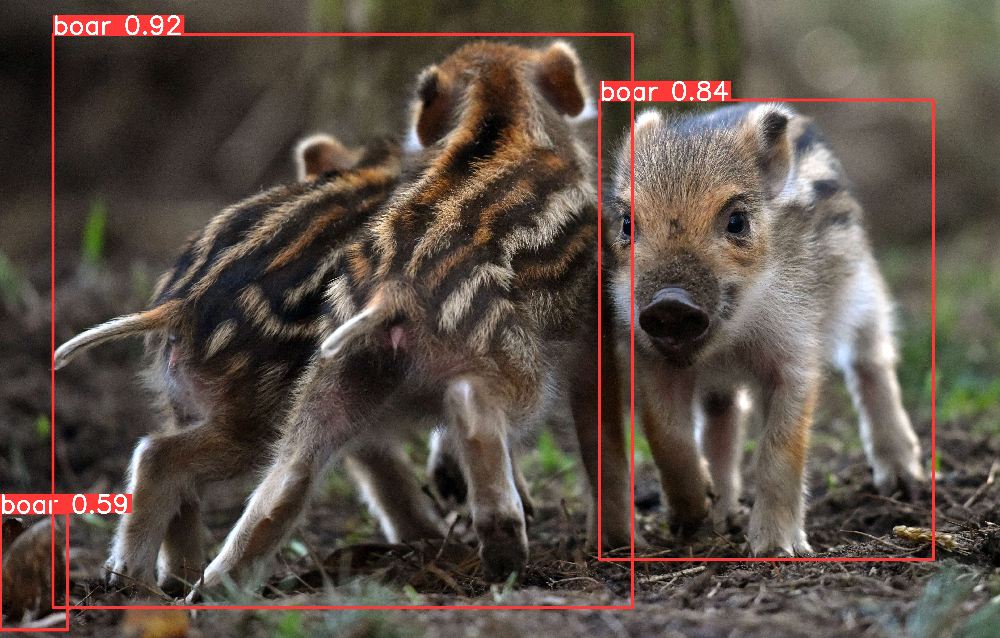

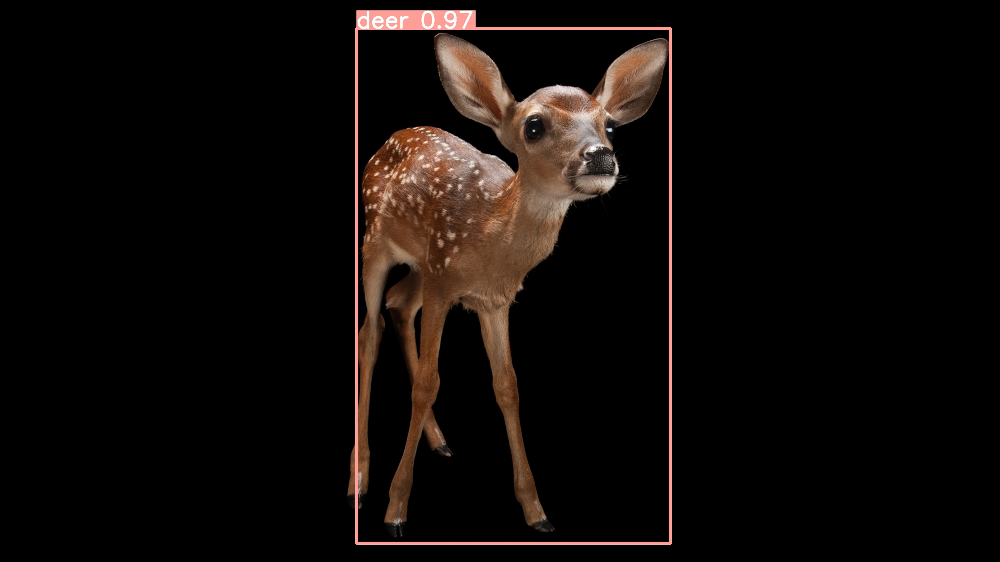

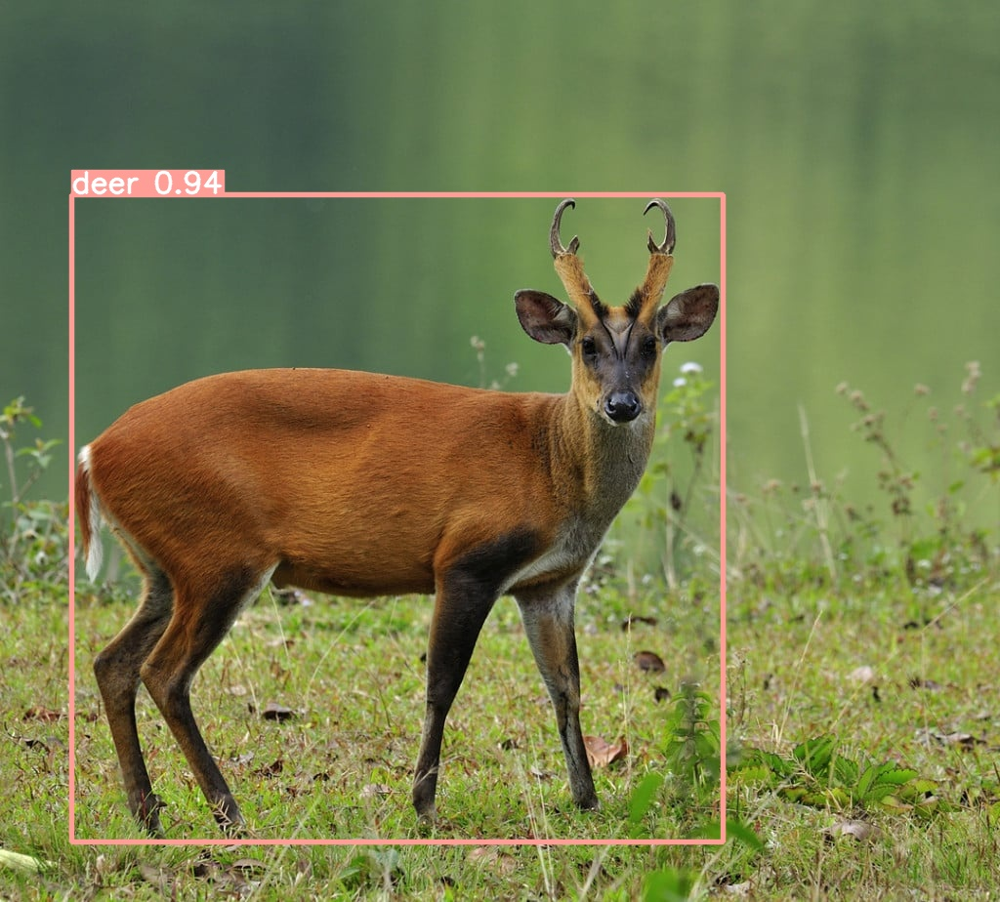

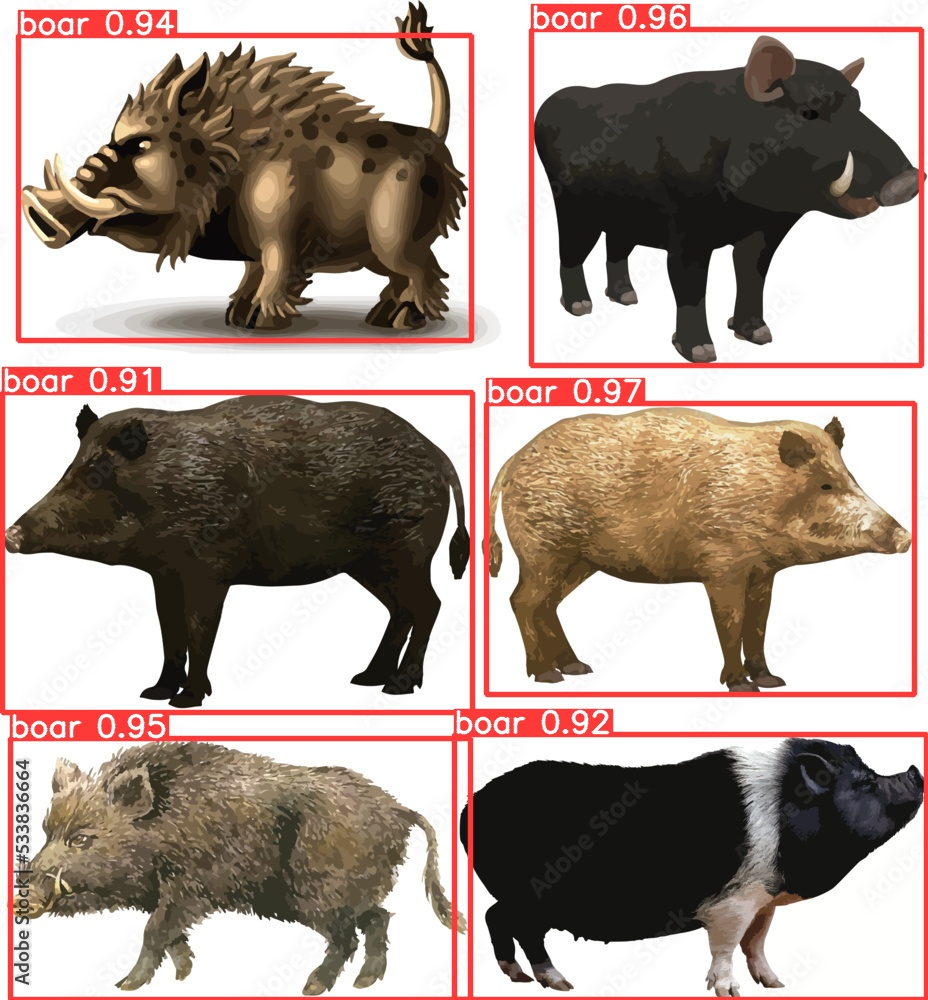

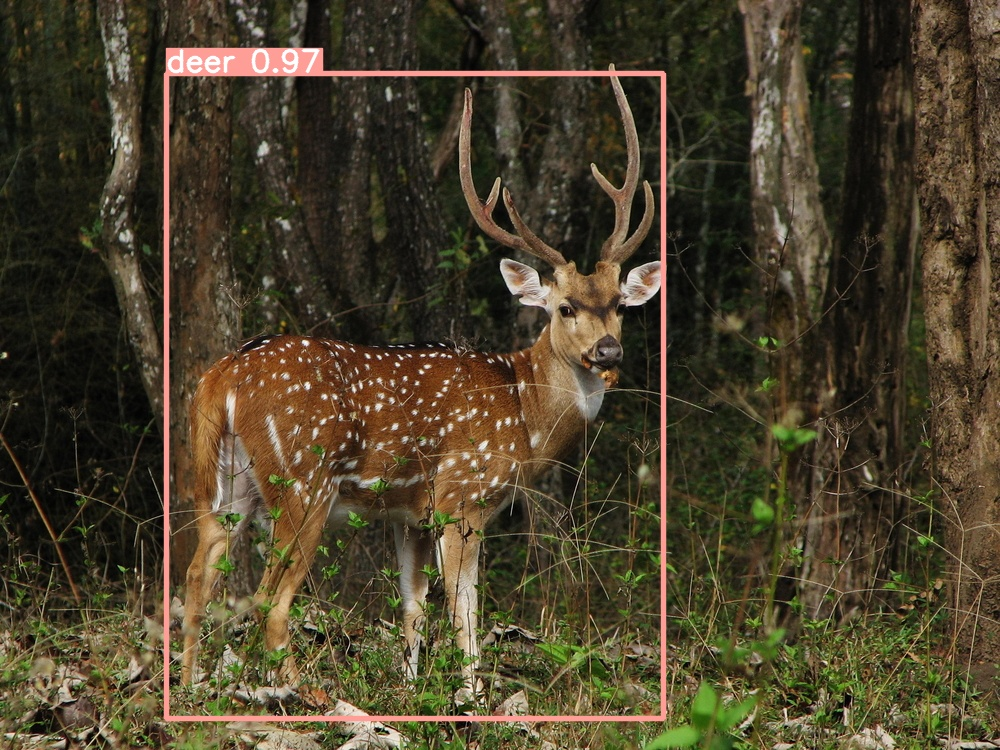

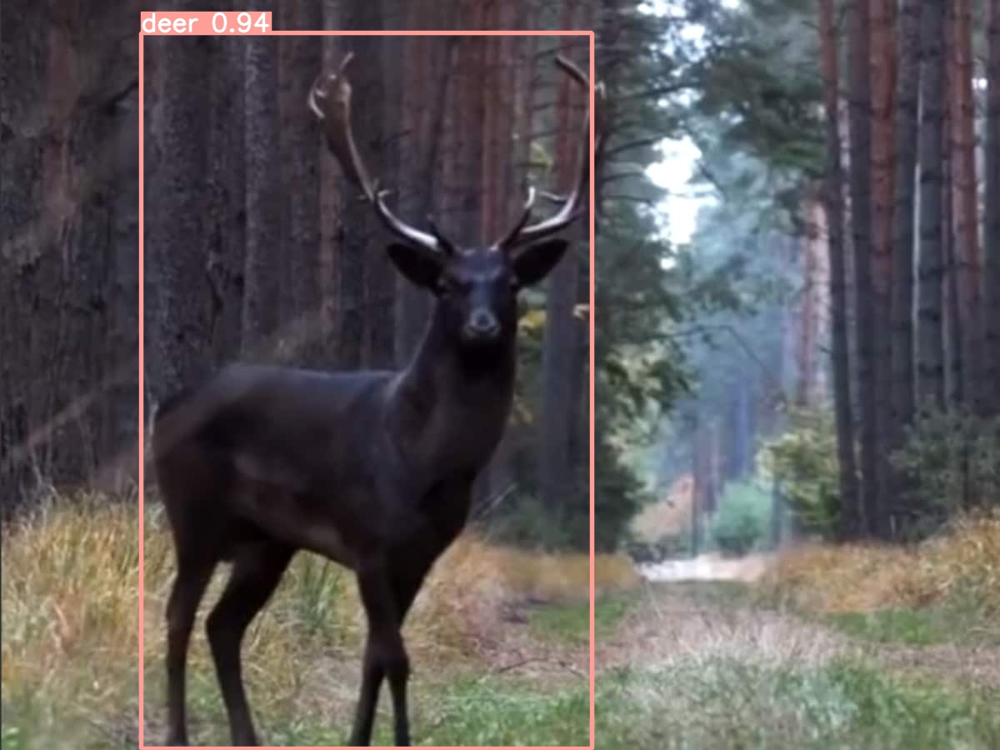

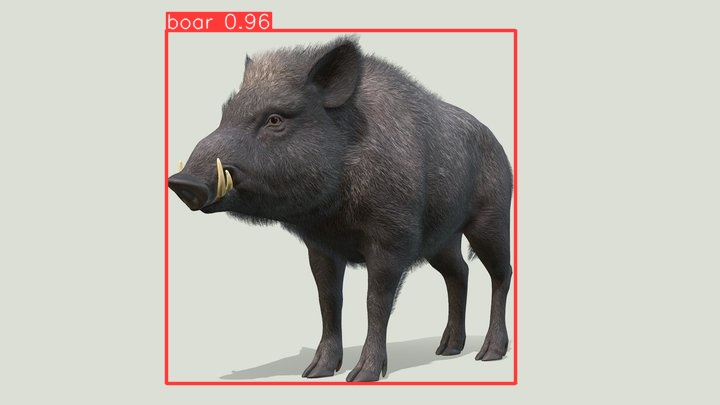

In [8]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:7]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [84]:
result = model.predict(source = ["http://www.pyreneanway.com/blog/wp-content/uploads/2018/11/wild-boar.jpg",
"https://www.mammal.org.uk/wp-content/uploads/2021/09/boar-300x300.jpg"], conf = 0.25, save = False )


0: 640x640 1 boar, 1: 640x640 1 boar, 166.2ms
Speed: 3.7ms preprocess, 83.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


In [89]:
result[0]

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'boar', 1: 'deer'}
obb: None
orig_img: array([[[ 65,  64,  73],
        [ 65,  64,  73],
        [ 64,  63,  72],
        ...,
        [ 39,  41,  42],
        [ 39,  41,  42],
        [ 40,  42,  43]],

       [[ 65,  64,  73],
        [ 65,  64,  73],
        [ 64,  63,  72],
        ...,
        [ 39,  40,  44],
        [ 40,  41,  45],
        [ 40,  41,  45]],

       [[ 66,  65,  74],
        [ 65,  64,  73],
        [ 65,  64,  73],
        ...,
        [ 40,  41,  45],
        [ 40,  41,  45],
        [ 41,  42,  46]],

       ...,

       [[109, 111, 112],
        [109, 111, 112],
        [109, 111, 112],
        ...,
        [100, 105, 104],
        [ 98, 103, 102],
        [ 96, 101, 100]],

       [[106, 108, 109],
        [108, 110, 111],
        [110, 112, 113],
        ...,
        [ 97, 102, 101],
        [ 96, 101, 100],
    

In [38]:
import json
import os
from collections import defaultdict
from ultralytics import YOLO



def number_dict(dict_labels, labels):
    dict_tmp = defaultdict(int)
    for label in labels:
        dict_tmp[int(label.item())]+=1

    dict_result={}
    for key, value in dict_labels.items():
        dict_result[key] = dict_tmp[value]
    
    return dict_result

def detect_animal(url, home_path, confidence = 0.25, last_train_id=13):
    # Define labels
    dict_labels = dict_labels = {'boar' : 0,
               'deer' : 1}
    
    # load model
    HOME = home_path
    
    # Load a model
    model = YOLO(f"{HOME}/runs/detect/train{last_train_id}/weights/best.pt")

    # Run inference
    results = model.predict(source = url, conf = confidence, save = False )
    
    # Extract results
    vars = ['x1', 'y1', 'x2', 'y2', 'score', 'class_id']
    list_result = []
    for r in results :
        dict_result = {}
        dict_result['img_source'] = r.orig_img.tolist()
        dict_result['img_annotated'] = r.plot().tolist()
        # Compute number of classes detected
        labels = r.boxes.cls
        number_of_detections_by_class = number_dict(dict_labels, labels)
        dict_result['number_of_detections_by_class'] = number_of_detections_by_class
        
        # Save positions
        dict_result['boxes'] = []
        for result in r.boxes.data.tolist():
            tmp_dict={}
            for i, value in enumerate(result):
                tmp_dict[vars[i]]=value
            dict_result['boxes'].append(tmp_dict)
        list_result.append(dict_result)

    return list_result

    


In [39]:
import os
HOME = os.getcwd()
HOME = os.path.dirname(HOME)
print(HOME)

results = detect_animal(["http://www.pyreneanway.com/blog/wp-content/uploads/2018/11/wild-boar.jpg",
"https://www.mammal.org.uk/wp-content/uploads/2021/09/boar-300x300.jpg"], HOME, confidence = 0.6, last_train_id=13)

/home/matfox44/cerf_sanglier_detection

0: 640x640 1 boar, 1: 640x640 1 boar, 77.5ms
Speed: 3.0ms preprocess, 38.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


In [40]:
results[0]['number_of_detections_by_class']

{'boar': 1, 'deer': 0}

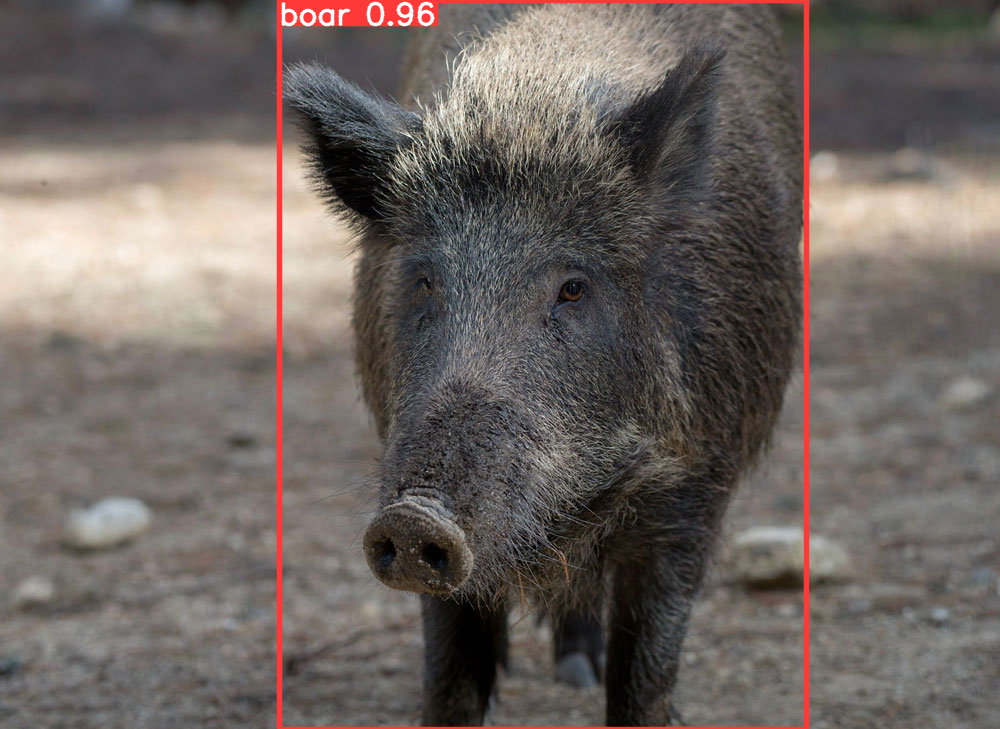

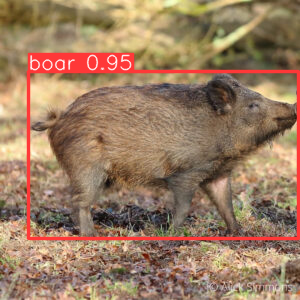

In [41]:
import numpy as np
from PIL import Image


def plot_annotated_fromresult(results) :
    for r in results:
        img = r['img_annotated']

        im_array = np.array(img).astype(np.uint8)  # plot a BGR numpy array of predictions
        im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
        im.show()  # show image

plot_annotated_fromresult(results)

In [46]:
%cd {HOME}
DATA_FOLDER = os.path.join(HOME,'data')
TEST_FOLDER = f"{DATA_FOLDER}/images/test_data"
onfig_file_path = os.path.join(HOME, 'config.yaml')

# Load a model
last_train_id=13
model = YOLO(f"{HOME}/runs/detect/train{last_train_id}/weights/best.pt")

result = model.val(data = onfig_file_path)

/home/matfox44/cerf_sanglier_detection
Ultralytics YOLOv8.1.5 🚀 Python-3.10.11 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 8192MiB)


/home/matfox44/miniconda3/envs/cerf_sanglier/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/matfox44/cerf_sanglier_detection/data/labels/valid_data.cache... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.96it/s]


                   all         75        124      0.868      0.844      0.897      0.753
                  boar         75         62      0.824      0.855      0.902      0.767
                  deer         75         62      0.912      0.833      0.892      0.739
Speed: 0.9ms preprocess, 7.4ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/val


## Download additional data

In [39]:
from openimages.download import download_dataset


download_dataset(
        dest_dir= 'download',
        class_labels = ['Deer'],
        annotation_format = "darknet",
        limit = 10,
)

2024-01-23  11:02:47 INFO Downloading 10 train images for class 'deer'
100%|██████████| 10/10 [00:01<00:00,  7.62it/s]
2024-01-23  11:02:49 INFO Creating 10 train annotations (darknet) for class 'deer'
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To d

{'deer': {'images_dir': 'download/deer/images',
  'annotations_dir': 'download/deer/darknet'}}